In [46]:
import os, sys
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import importlib.util
import plotly.express as px
from datetime import datetime
# Get current path from where script is executed
if os.name == 'nt':
    sep = '\\'
elif os.name == 'posix':
    sep = '/'
else:
    print(f'What is this OS? {os.name}')

path = os.getcwd()
path_datasets = path[:-len(f'Code{sep}src{sep}project_CSP_MATH_571')] + f'DataSets{sep}weather{sep}'


#MapGenerator Lib
path_maps = path + f'{sep}mapGeneration{sep}mapGeneration.py'
spec = importlib.util.spec_from_file_location("mapGeneration", path_maps)
mp = importlib.util.module_from_spec(spec)
spec.loader.exec_module(mp)


### Load Data 

In [48]:
# Read csv
datasets = os.listdir(path_datasets)

df_list = []
for dataset in datasets:
    if dataset[-4:] == '.csv':
        df = pd.read_csv(path_datasets + dataset, index_col=None, header=0, na_values=['M','T'])
        df_list.append(df)


# Merge Taxis Data
df = pd.concat(df_list, axis=0, ignore_index=True)

del(df_list)

df.head()

,station,valid,tmpf,relh,drct,sknt,p01m,skyc1
0,ORD,2017-01-01 00:51,23.0,84.39,250.0,4.0,0.0,CLR
1,ORD,2017-01-01 01:51,21.0,84.62,0.0,0.0,0.0,CLR
2,ORD,2017-01-01 02:51,21.0,87.97,210.0,4.0,0.0,CLR
3,ORD,2017-01-01 03:51,19.0,87.87,190.0,5.0,0.0,CLR
4,ORD,2017-01-01 04:51,21.0,87.97,200.0,4.0,0.0,CLR


### Shape of Dataset

In [49]:
df.shape

(34278, 8)

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34278 entries, 0 to 34277
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   station  34278 non-null  object 
 1   valid    34278 non-null  object 
 2   tmpf     32575 non-null  float64
 3   relh     32476 non-null  float64
 4   drct     33885 non-null  float64
 5   sknt     34212 non-null  float64
 6   p01m     28725 non-null  float64
 7   skyc1    34251 non-null  object 
dtypes: float64(5), object(3)
memory usage: 2.1+ MB


In [51]:
for col in df.columns: 
    print(col) 

station
valid
tmpf
relh
drct
sknt
p01m
skyc1


In [52]:
df = df.rename(columns={"valid": "datetime","tmpf": "temperature", "relh":"relative_humidity","drct": "wind_direction","sknt":"wind_speed",
                "p01m":"precipitation","skyc1":"sky_level"})

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34278 entries, 0 to 34277
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   station            34278 non-null  object 
 1   datetime           34278 non-null  object 
 2   temperature        32575 non-null  float64
 3   relative_humidity  32476 non-null  float64
 4   wind_direction     33885 non-null  float64
 5   wind_speed         34212 non-null  float64
 6   precipitation      28725 non-null  float64
 7   sky_level          34251 non-null  object 
dtypes: float64(5), object(3)
memory usage: 2.1+ MB


### Convert into datetime format

In [54]:
df['datetime'] =  pd.to_datetime(df['datetime'], format=r"%Y-%m-%d %H:%M")

In [55]:
df

,station,datetime,temperature,relative_humidity,wind_direction,wind_speed,precipitation,sky_level
0,ORD,2017-01-01 00:51:00,23.0,84.39,250.0,4.0,0.0,CLR
1,ORD,2017-01-01 01:51:00,21.0,84.62,0.0,0.0,0.0,CLR
2,ORD,2017-01-01 02:51:00,21.0,87.97,210.0,4.0,0.0,CLR
3,ORD,2017-01-01 03:51:00,19.0,87.87,190.0,5.0,0.0,CLR
4,ORD,2017-01-01 04:51:00,21.0,87.97,200.0,4.0,0.0,CLR
...,...,...,...,...,...,...,...,...
34273,ORD,2019-12-30 21:51:00,27.0,88.65,230.0,19.0,NaN,SCT
34274,ORD,2019-12-30 22:23:00,27.0,84.66,240.0,14.0,NaN,SCT
34275,ORD,2019-12-30 22:33:00,27.0,84.66,240.0,19.0,NaN,SCT
34276,ORD,2019-12-30 22:51:00,27.0,80.83,240.0,20.0,NaN,BKN


### Count of missing value

In [56]:
 df.isna().sum()

station                 0
datetime                0
temperature          1703
relative_humidity    1802
wind_direction        393
wind_speed             66
precipitation        5553
sky_level              27
dtype: int64

### Plot the missing value

In [57]:
def plotmissing(col, time='M', fromDate=None, toDate=None, hist=False):
    # Randomly group by start timestamp
    df.index = df['datetime']
    # Total elements
    df_plot = df
    
    if fromDate is not None:
        df_plot = df_plot.loc[df_plot['datetime']>fromDate]      
    if toDate is not None:
        df_plot = df_plot.loc[df_plot['datetime']<toDate]  
        
    timeStart_grouped = df_plot[col].groupby(pd.Grouper(freq=time))
    # Total NA elements
    timeStart_tollNA_grouped = df_plot.loc[df_plot[col].isna(),].groupby(pd.Grouper(freq=time))

    y = 100 * timeStart_tollNA_grouped.size()/timeStart_grouped.size()

    # Plot
    plt.figure(figsize=(10,5))
    plt.fill_between(y.index, y, color='blue', alpha=0.5)
    plt.plot(y, color='red')
    plt.grid()
    plt.xticks(rotation=25, ha='right')
    plt.xlabel('Date')
    plt.ylabel('% of missing NA ')

    plt.show()

### Missing % of NA in temperature col

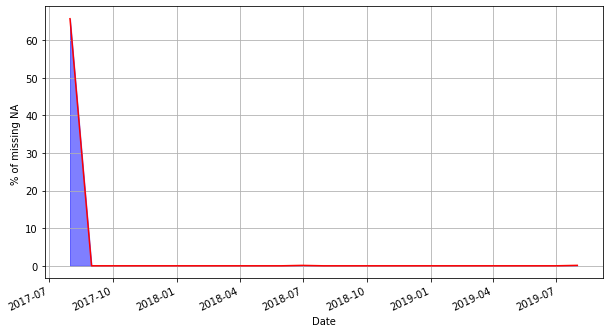

In [58]:
plotmissing('temperature')

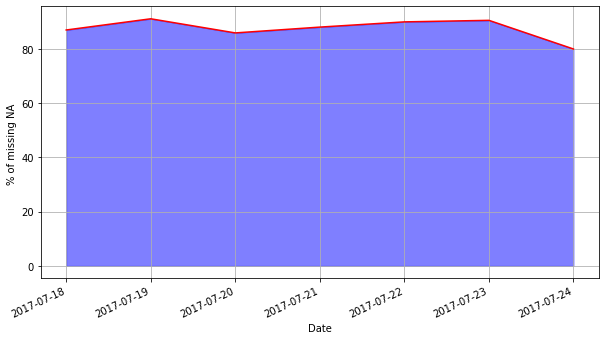

In [62]:
plotmissing('temperature', time='D', toDate=pd.to_datetime(r'2018-05', format='%Y-%m'))

### Plot temperature

In [63]:
temperaturefig = px.line(df, x='datetime', y='temperature')
temperaturefig.show()

### Fill the missing value with last known value

In [64]:
def fill(x,y):
    l=len(x)
    for i in range(l):
        if(x.iloc[i]!='M'):

            t=x.iloc[i]
            start=y.iloc[i]
        else:
            end=y.iloc[i]
            s2=end-start
            s2=s2.total_seconds()


            if (s2<=7200):
                x.iloc[i]=t
            else:
                print("Don't do that yo!!")

In [65]:
fill(df['temperature'],df['datetime'])

### All the missing value in temperature

In [66]:
# df.loc[df['temperature'] == 'M']

In [67]:
# fig = px.line(df, x='datetime', y='temperature')
# fig.show()

### Plotting missing value of relative humidity

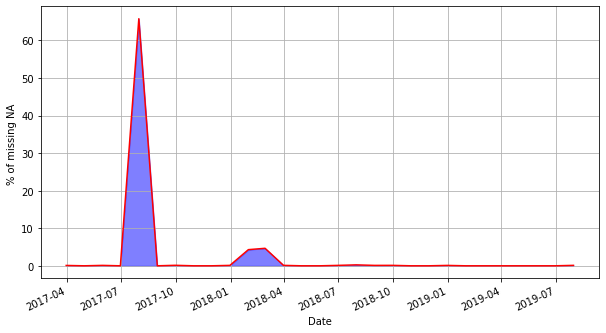

In [68]:
plotmissing('relative_humidity')

In [69]:
#df.loc[df['relative_humidity'] == 'M']

### Plotting relative humidity

In [70]:
fig = px.line(df, x='datetime', y='relative_humidity')
fig.show()

### Fill missing value of relative humidity

In [71]:
fill(df['relative_humidity'],df['datetime'])

In [72]:
#df.loc[df['relative_humidity'] == 'M']

### Plot missing value of wind direction

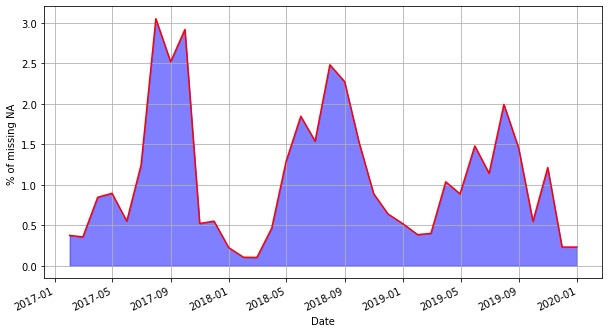

In [73]:
plotmissing('wind_direction')

### Fill missing value of wind direction

In [74]:
fill(df['wind_direction'],df['datetime'])

In [75]:
#df.loc[df['wind_direction'] == 'M']

In [76]:
fig = px.line(df, x='datetime', y='wind_direction')
fig.show()

### Plot missing value of Wind Speed

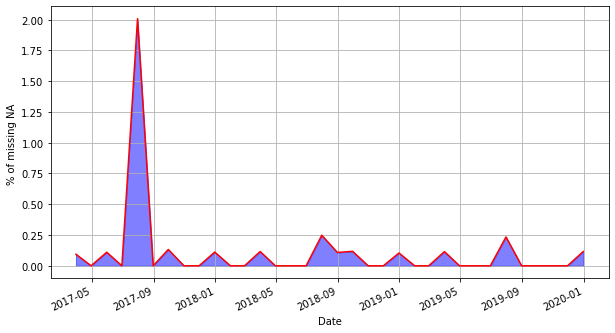

In [77]:
plotmissing('wind_speed')

### Plot Wind direction 

In [78]:
fig = px.line(df, x='datetime', y='wind_speed')
fig.show()

### Fill missing value

In [79]:
fill(df['wind_speed'],df['datetime'])

### Plot wind speed after filling missing value

In [80]:
# fig = px.line(df, x='datetime', y='wind_speed')
# fig.show()

In [81]:
#df.loc[df['wind_speed'] == 'M']

### Plot missing value of precipitation

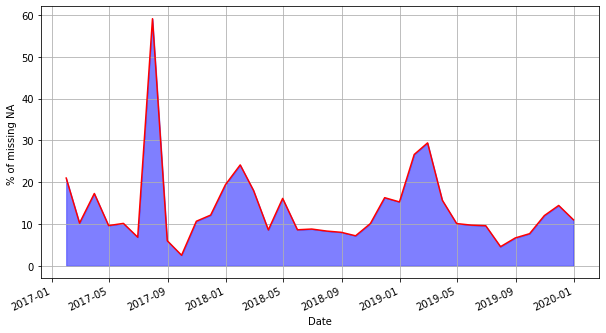

In [82]:
plotmissing('precipitation')

### Plot the precipitation

In [83]:
# fig = px.line(df, x='datetime', y='precipitation')
# fig.show()

### Fill the missing value

In [84]:
fill(df['precipitation'],df['datetime'])

In [86]:
l=len(df['precipitation'])
for i in range(l):
    if(df['precipitation'].iloc[i]!='T'):

        t=df['precipitation'].iloc[i]
        start=df['datetime'].iloc[i]
    else:
        end=df['datetime'].iloc[i]
        s2=end-start
        s2=s2.total_seconds()


        if (s2<=7200):
            df['precipitation'].iloc[i]=t
        else:
            print("Don't do that yo!!")

In [87]:
# fig = px.line(df, x='datetime', y='precipitation')
# fig.show()

### missing value in sky level

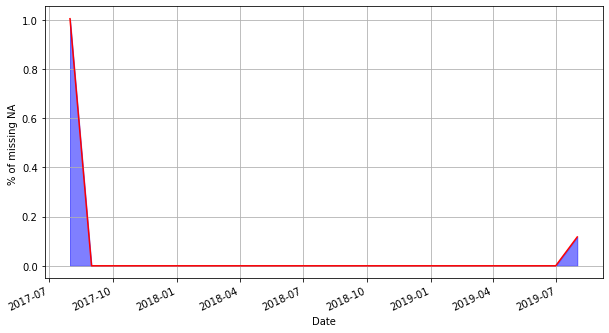

In [88]:
plotmissing('sky_level')

In [89]:

# ASOS Measured Human ASOS
# Amount in % Equivalent Report
# of sky cover in oktas
# 00 to < 05 0 CLR
# > 05 to < 25 > 0 to 2/8 FEW
# > 25 to < 50 > 2/8 to < 4/8 SCT
# > 50 to < 87 > 4/8 to < 8/8 BKN
# > 87 to 100 8/8 OVC

### Plot sky value

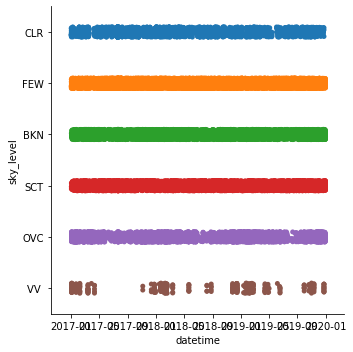

In [90]:
sns.catplot(x="datetime", y="sky_level", data=df)

In [91]:
#df.loc[df['sky_level'] == 'M'].head()

### Fill Missing value

In [92]:
fill(df['sky_level'],df['datetime'])

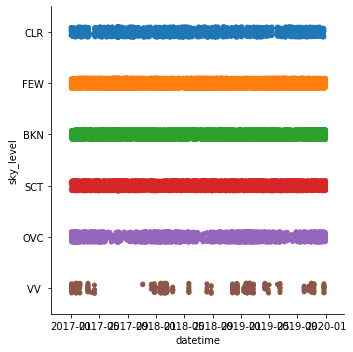

In [93]:
sns.catplot(x="datetime", y="sky_level", data=df)

In [94]:
df

,station,datetime,temperature,relative_humidity,wind_direction,wind_speed,precipitation,sky_level
datetime,,,,,,,,
2017-01-01 00:51:00,ORD,2017-01-01 00:51:00,23.0,84.39,250.0,4.0,0.0,CLR
2017-01-01 01:51:00,ORD,2017-01-01 01:51:00,21.0,84.62,0.0,0.0,0.0,CLR
2017-01-01 02:51:00,ORD,2017-01-01 02:51:00,21.0,87.97,210.0,4.0,0.0,CLR
2017-01-01 03:51:00,ORD,2017-01-01 03:51:00,19.0,87.87,190.0,5.0,0.0,CLR
2017-01-01 04:51:00,ORD,2017-01-01 04:51:00,21.0,87.97,200.0,4.0,0.0,CLR
...,...,...,...,...,...,...,...,...
2019-12-30 21:51:00,ORD,2019-12-30 21:51:00,27.0,88.65,230.0,19.0,NaN,SCT
2019-12-30 22:23:00,ORD,2019-12-30 22:23:00,27.0,84.66,240.0,14.0,NaN,SCT
2019-12-30 22:33:00,ORD,2019-12-30 22:33:00,27.0,84.66,240.0,19.0,NaN,SCT


In [95]:
df['temperature'] = pd.to_numeric(df['temperature'])
df['relative_humidity'] = pd.to_numeric(df['relative_humidity'])
df['wind_direction'] = pd.to_numeric(df['wind_direction'])
df['wind_speed'] = pd.to_numeric(df['wind_speed'])
df['precipitation'] = pd.to_numeric(df['precipitation'])




In [96]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 34278 entries, 2017-01-01 00:51:00 to 2019-12-30 23:51:00
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   station            34278 non-null  object        
 1   datetime           34278 non-null  datetime64[ns]
 2   temperature        32575 non-null  float64       
 3   relative_humidity  32476 non-null  float64       
 4   wind_direction     33885 non-null  float64       
 5   wind_speed         34212 non-null  float64       
 6   precipitation      28725 non-null  float64       
 7   sky_level          34251 non-null  object        
dtypes: datetime64[ns](1), float64(5), object(2)
memory usage: 3.6+ MB


In [97]:
import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)

### Boxplot of all the features

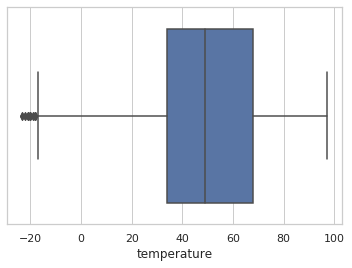

In [98]:
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['temperature'])

In [99]:
df['temperature'].sort_values()

datetime
2019-01-30 06:51:00   -23.1
2019-01-30 07:51:00   -23.1
2019-01-30 05:51:00   -22.0
2019-01-30 08:51:00   -22.0
2019-01-31 05:51:00   -20.9
                       ... 
2017-07-24 09:00:00     NaN
2017-07-24 09:05:00     NaN
2017-07-24 09:10:00     NaN
2018-06-13 09:51:00     NaN
2019-07-20 12:33:00     NaN
Name: temperature, Length: 34278, dtype: float64

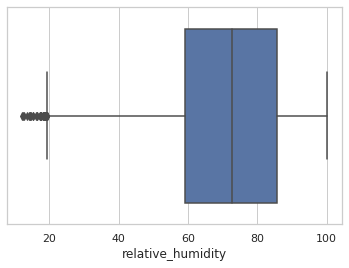

In [100]:
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['relative_humidity'])

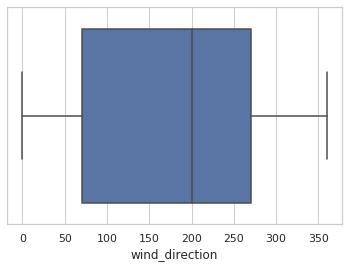

In [101]:
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['wind_direction'])

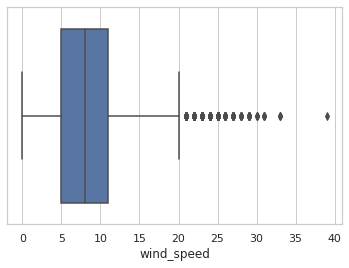

In [102]:
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['wind_speed'])

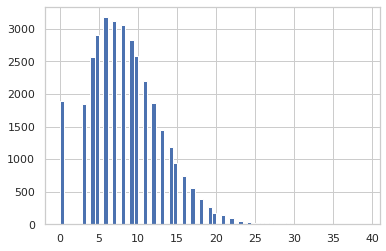

In [103]:
hist = df['wind_speed'].hist(bins=70)   

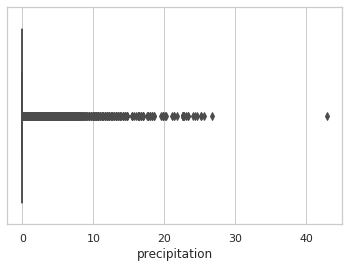

In [104]:
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['precipitation'])

In [105]:
df['precipitation'].sort_values(ascending=False)

datetime
2018-08-07 15:51:00    42.93
2019-10-02 23:51:00    26.67
2018-08-07 15:43:00    25.65
2019-05-27 14:51:00    25.15
2019-05-27 14:48:00    25.15
                       ...  
2019-12-30 21:51:00      NaN
2019-12-30 22:23:00      NaN
2019-12-30 22:33:00      NaN
2019-12-30 22:51:00      NaN
2019-12-30 23:51:00      NaN
Name: precipitation, Length: 34278, dtype: float64

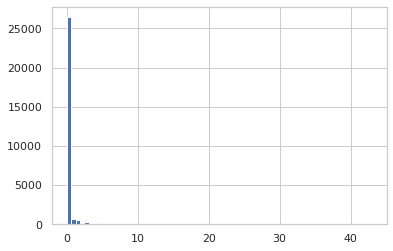

In [106]:
hist = df['precipitation'].hist(bins=70)      